<a href="https://colab.research.google.com/github/ToheebOlatunji/PERSONAL-PROJECTS-AND-MODELS/blob/main/XRD_Intensity_Comparison_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

XRD Data Visualization and Analysis
Publication-Quality Plots (600 DPI)

Dataset:
                   Miller_Indices  BCZY_Reference  BCZY with crystal MgO  \
Peak Position (2θ)                                                         
29.6                          110           100.0                    100   
36.5                          111             7.0                      6   
42.4                          200            41.0                     37   
52.6                          210            57.0                     50   
61.5                          220            26.0                     23   

                    Crystal YSZ plane with insertions  BCZY with Crystal YSZ  \
Peak Position (2θ)                                                             
29.6                                              100                    100   
36.5                                                1                      5   
42.4                                                7            

ValueError: keyword alpha is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

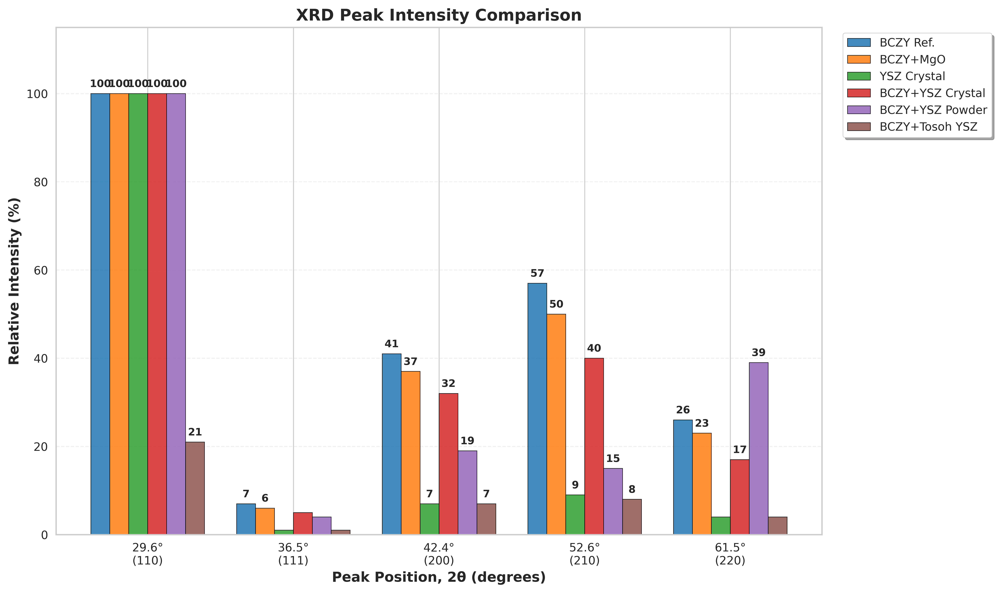

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

# Publication-ready plot settings
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})

# Set style for better plots
sns.set_style("whitegrid")
sns.set_palette("deep")

def create_xrd_dataframe():
    """Create the XRD dataset from the provided data"""

    # Peak positions and Miller indices
    peak_positions = [29.6, 36.5, 42.4, 52.6, 61.5]
    miller_indices = ['110', '111', '200', '210', '220']

    # Sample data
    samples_data = {
        'BCZY_Reference': [100, 7.00, 41, 57, 26],
        'BCZY with crystal MgO': [100, 6, 37, 50, 23],
        'Crystal YSZ plane with insertions': [100, 1, 7, 9, 4],
        'BCZY with Crystal YSZ': [100, 5, 32, 40, 17],
        'BCZY with powder YSZ': [100, 4, 19, 15, 39],
        'BCZY with Tosoh YSZ': [21, 1, 7, 8, 4]
    }

    # Create DataFrame
    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    # Add Miller indices as a column for reference
    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices

def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    """Create publication-ready comparative bar chart for all samples"""
    fig, ax = plt.subplots(figsize=(12, 8))

    # Create bar chart with publication-quality colors
    x = np.arange(len(peak_positions))
    width = 0.13

    # Professional color scheme
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

    sample_names_short = [
        'BCZY Ref.',
        'BCZY+MgO',
        'YSZ Crystal',
        'BCZY+YSZ Crystal',
        'BCZY+YSZ Powder',
        'BCZY+Tosoh YSZ'
    ]

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                     label=short_name, alpha=0.85, color=color,
                     edgecolor='black', linewidth=0.5)

        # Add value labels on bars for significant values
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:  # Only label significant peaks
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                       f'{int(height)}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Formatting for publication
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=12, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)],
                       fontsize=10)
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, fancybox=True, shadow=True)
    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.15)

    # Add minor ticks
    ax.tick_params(which='minor', length=4, color='gray', alpha=0.7)
    ax.tick_params(which='major', length=6, color='black')

    plt.tight_layout()

    if save_plots:
        plt.savefig('XRD_Peak_Comparison_600dpi.png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
        print("Saved: XRD_Peak_Comparison_600dpi.png (600 DPI)")

    plt.show()

def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    """Create publication-ready heatmap showing intensity patterns"""
    fig, ax = plt.subplots(figsize=(10, 8))

    # Create custom colormap for publication
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)

    # Prepare data with shortened sample names
    sample_names_short = [
        'BCZY Reference',
        'BCZY + MgO',
        'YSZ Crystal Plane',
        'BCZY + YSZ Crystal',
        'BCZY + YSZ Powder',
        'BCZY + Tosoh YSZ'
    ]

    df_plot = df.T.copy()
    df_plot.index = sample_names_short

    # Create heatmap
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    # Add text annotations
    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center',
                   fontsize=11, fontweight='bold', color=color)

    # Formatting
    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)],
                       fontsize=10)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=10)

    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=12, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap', fontsize=14, fontweight='bold', pad=20)

    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)

    # Add grid lines
    ax.set_xticks(np.arange(-0.5, len(peak_positions), 1), minor=True)
    ax.set_yticks(np.arange(-0.5, len(sample_names_short), 1), minor=True)
    ax.grid(which='minor', color='gray', linestyle='-', linewidth=0.5, alpha=0.7)

    plt.tight_layout()

    if save_plots:
        plt.savefig('XRD_Heatmap_600dpi.png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
        print("Saved: XRD_Heatmap_600dpi.png (600 DPI)")

    plt.show()

def plot_line_patterns(df, peak_positions, miller_indices, save_plots=True):
    """Create publication-ready line plot showing XRD patterns"""
    fig, ax = plt.subplots(figsize=(12, 8))

    # Professional colors and line styles
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    linestyles = ['-', '--', '-.', ':', '-', '--']
    markers = ['o', 's', '^', 'D', 'v', 'p']

    sample_names_short = [
        'BCZY Reference',
        'BCZY + MgO',
        'YSZ Crystal Plane',
        'BCZY + YSZ Crystal',
        'BCZY + YSZ Powder',
        'BCZY + Tosoh YSZ'
    ]

    for i, (sample, short_name) in enumerate(zip(df.columns, sample_names_short)):
        ax.plot(peak_positions, df.loc[:, sample],
                color=colors[i], linestyle=linestyles[i], marker=markers[i],
                linewidth=2.5, markersize=8, markerfacecolor='white',
                markeredgewidth=2, markeredgecolor=colors[i],
                label=short_name, alpha=0.9)

    # Formatting
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=12, fontweight='bold')
    ax.set_title('XRD Diffraction Patterns', fontsize=14, fontweight='bold')
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True,
              fancybox=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    # Add Miller indices annotations
    for pos, miller in zip(peak_positions, miller_indices):
        ax.axvline(x=pos, color='gray', linestyle=':', alpha=0.6, linewidth=1)
        ax.text(pos, ax.get_ylim()[1]*0.95, f'({miller})',
               ha='center', va='bottom', fontweight='bold', fontsize=9,
               bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))

    ax.set_xlim(peak_positions[0]-2, peak_positions[-1]+2)
    ax.set_ylim(0, max(df.max()) * 1.1)

    # Add minor ticks
    ax.tick_params(which='minor', length=4, color='gray', alpha=0.7)
    ax.tick_params(which='major', length=6, color='black')

    plt.tight_layout()

    if save_plots:
        plt.savefig('XRD_Line_Patterns_600dpi.png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
        print("Saved: XRD_Line_Patterns_600dpi.png (600 DPI)")

    plt.show()

def plot_stacked_diffraction_patterns(df, peak_positions, miller_indices, save_plots=True):
    """Create publication-ready stacked XRD patterns (traditional style)"""
    fig, ax = plt.subplots(figsize=(12, 10))

    # Colors and offsets for stacked patterns
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

    sample_names_short = [
        'BCZY Reference',
        'BCZY + MgO',
        'YSZ Crystal Plane',
        'BCZY + YSZ Crystal',
        'BCZY + YSZ Powder',
        'BCZY + Tosoh YSZ'
    ]

    # Create stacked patterns with offset
    offset_increment = max(df.max()) * 0.8

    for i, (sample, short_name, color) in enumerate(zip(df.columns, sample_names_short, colors)):
        y_offset = i * offset_increment
        intensities = df.loc[:, sample] + y_offset

        # Plot the pattern
        ax.plot(peak_positions, intensities, color=color, linewidth=2, alpha=0.9)
        ax.fill_between(peak_positions, y_offset, intensities, alpha=0.3, color=color)

        # Add sample label
        ax.text(peak_positions[-1] + 1, y_offset + max(df.loc[:, sample])/2,
               short_name, fontsize=11, fontweight='bold', va='center')

        # Add peak markers for significant peaks
        for pos, intensity in zip(peak_positions, df.loc[:, sample]):
            if intensity > 20:  # Only mark significant peaks
                ax.plot(pos, intensity + y_offset, 'o', color=color,
                       markersize=6, markerfacecolor='white', markeredgewidth=1.5)

    # Formatting
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Relative Intensity (offset)', fontsize=12, fontweight='bold')
    ax.set_title('Stacked XRD Diffraction Patterns', fontsize=14, fontweight='bold')

    # Add Miller indices
    for pos, miller in zip(peak_positions, miller_indices):
        ax.axvline(x=pos, color='gray', linestyle='--', alpha=0.5, linewidth=1)
        ax.text(pos, ax.get_ylim()[1]*0.95, f'({miller})',
               ha='center', va='bottom', fontweight='bold', fontsize=9,
               bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))

    ax.grid(True, alpha=0.3, axis='x', linestyle=':')
    ax.set_xlim(peak_positions[0]-2, peak_positions[-1]+8)
    ax.set_yticks([])  # Remove y-ticks for stacked plot

    plt.tight_layout()

    if save_plots:
        plt.savefig('XRD_Stacked_Patterns_600dpi.png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
        print("Saved: XRD_Stacked_Patterns_600dpi.png (600 DPI)")

    plt.show()

def plot_radar_chart(df, peak_positions, miller_indices, save_plots=True):
    """Create publication-ready radar chart for pattern comparison"""
    # Normalize data for radar chart (0-100 scale)
    df_norm = df / df.max() * 100

    angles = np.linspace(0, 2*np.pi, len(peak_positions), endpoint=False).tolist()
    angles += angles[:1]  # Complete the circle

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))

    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    linestyles = ['-', '--', '-.', ':', '-', '--']

    sample_names_short = [
        'BCZY Reference',
        'BCZY + MgO',
        'YSZ Crystal Plane',
        'BCZY + YSZ Crystal',
        'BCZY + YSZ Powder',
        'BCZY + Tosoh YSZ'
    ]

    for i, (sample, short_name, color, linestyle) in enumerate(zip(df.columns, sample_names_short, colors, linestyles)):
        values = df_norm.loc[:, sample].tolist()
        values += values[:1]  # Complete the circle

        ax.plot(angles, values, linestyle, linewidth=2.5, label=short_name,
               color=color, alpha=0.8, marker='o', markersize=6)
        ax.fill(angles, values, alpha=0.1, color=color)

    # Customize the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)],
                       fontsize=11)
    ax.set_ylim(0, 100)
    ax.set_ylabel('Normalized Intensity (%)', fontsize=10, labelpad=30)
    ax.set_title('XRD Pattern Radar Chart', fontsize=14, fontweight='bold', pad=30)
    ax.legend(bbox_to_anchor=(1.3, 1.1), fontsize=10, frameon=True, fancybox=True, shadow=True)
    ax.grid(True, alpha=0.3)

    # Add radial grid labels
    ax.set_yticks([20, 40, 60, 80, 100])
    ax.set_yticklabels(['20%', '40%', '60%', '80%', '100%'], fontsize=9)

    plt.tight_layout()

    if save_plots:
        plt.savefig('XRD_Radar_Chart_600dpi.png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
        print("Saved: XRD_Radar_Chart_600dpi.png (600 DPI)")

    plt.show()

def create_publication_figure(df, peak_positions, miller_indices):
    """Create a combined publication figure with multiple subplots"""
    fig = plt.figure(figsize=(16, 12))

    # Set up the grid
    gs = fig.add_gridspec(2, 2, hspace=0.3, wspace=0.3)

    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['BCZY Ref.', 'BCZY+MgO', 'YSZ Crystal', 'BCZY+YSZ Crystal', 'BCZY+YSZ Powder', 'BCZY+Tosoh YSZ']

    # 1. Bar chart (top left)
    ax1 = fig.add_subplot(gs[0, 0])
    x = np.arange(len(peak_positions))
    width = 0.13

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        ax1.bar(x + offset, df.loc[:, sample], width,
               label=short_name, alpha=0.85, color=color,
               edgecolor='black', linewidth=0.3)

    ax1.set_xlabel('Peak Position, 2θ (°)', fontweight='bold', fontsize=10)
    ax1.set_ylabel('Relative Intensity (%)', fontweight='bold', fontsize=10)
    ax1.set_title('(a) Peak Intensity Comparison', fontweight='bold', loc='left', fontsize=11)
    ax1.set_xticks(x)
    ax1.set_xticklabels([f'{pos}°' for pos in peak_positions], fontsize=9)
    ax1.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax1.tick_params(labelsize=9)

    # 2. Line patterns (top right)
    ax2 = fig.add_subplot(gs[0, 1])
    linestyles = ['-', '--', '-.', ':', '-', '--']
    markers = ['o', 's', '^', 'D', 'v', 'p']

    for i, (sample, short_name) in enumerate(zip(df.columns, sample_names_short)):
        ax2.plot(peak_positions, df.loc[:, sample],
                color=colors[i], linestyle=linestyles[i], marker=markers[i],
                linewidth=1.5, markersize=5, markerfacecolor='white',
                markeredgewidth=1, markeredgecolor=colors[i],
                label=short_name, alpha=0.9)

    ax2.set_xlabel('Peak Position, 2θ (°)', fontweight='bold', fontsize=10)
    ax2.set_ylabel('Relative Intensity (%)', fontweight='bold', fontsize=10)
    ax2.set_title('(b) XRD Patterns', fontweight='bold', loc='left', fontsize=11)
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.tick_params(labelsize=9)

    # 3. Heatmap (bottom left)
    ax3 = fig.add_subplot(gs[1, 0])
    colors_hmap = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors_hmap, N=256)

    df_plot = df.T.copy()
    df_plot.index = [name.replace(' ', '\n') for name in sample_names_short]

    im = ax3.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    # Add text annotations
    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color_text = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax3.text(j, i, f'{int(value)}', ha='center', va='center',
                    fontsize=9, fontweight='bold', color=color_text)

    ax3.set_xticks(range(len(peak_positions)))
    ax3.set_xticklabels([f'{pos}°' for pos in peak_positions], fontsize=9)
    ax3.set_yticks(range(len(sample_names_short)))
    ax3.set_yticklabels([name.replace(' ', '\n') for name in sample_names_short], fontsize=8)
    ax3.set_xlabel('Peak Position, 2θ (°)', fontweight='bold', fontsize=10)
    ax3.set_title('(c) Intensity Heatmap', fontweight='bold', loc='left', fontsize=11)

    # 4. Stacked patterns (bottom right)
    ax4 = fig.add_subplot(gs[1, 1])
    offset_increment = max(df.max()) * 0.6

    for i, (sample, short_name, color) in enumerate(zip(df.columns, sample_names_short, colors)):
        y_offset = i * offset_increment
        intensities = df.loc[:, sample] + y_offset

        ax4.plot(peak_positions, intensities, color=color, linewidth=1.5, alpha=0.9)
        ax4.fill_between(peak_positions, y_offset, intensities, alpha=0.2, color=color)

        # Add sample label
        ax4.text(peak_positions[-1] + 0.5, y_offset + max(df.loc[:, sample])/3,
                short_name, fontsize=8, fontweight='bold', va='center')

    ax4.set_xlabel('Peak Position, 2θ (°)', fontweight='bold', fontsize=10)
    ax4.set_ylabel('Relative Intensity (offset)', fontweight='bold', fontsize=10)
    ax4.set_title('(d) Stacked Patterns', fontweight='bold', loc='left', fontsize=11)
    ax4.grid(True, alpha=0.3, axis='x', linestyle=':')
    ax4.set_xlim(peak_positions[0]-1, peak_positions[-1]+4)
    ax4.set_yticks([])
    ax4.tick_params(labelsize=9)

    # Add Miller indices to the first subplot
    for i, (pos, miller) in enumerate(zip(peak_positions, miller_indices)):
        ax1.text(i, ax1.get_ylim()[1]*0.95, f'({miller})',
                ha='center', va='bottom', fontweight='bold', fontsize=8,
                bbox=dict(boxstyle='round,pad=0.1', facecolor='white', alpha=0.8))

    # Add a single legend for the entire figure
    handles, labels = ax2.get_legend_handles_labels()
    fig.legend(handles, labels, bbox_to_anchor=(0.98, 0.98), loc='upper right',
              fontsize=9, frameon=True, fancybox=True, shadow=True)

    plt.suptitle('XRD Analysis of BCZY-based Samples', fontsize=16, fontweight='bold', y=0.98)

    # Save the combined figure
    plt.savefig('XRD_Combined_Publication_Figure_600dpi.png', dpi=600, bbox_inches='tight',
               facecolor='white', edgecolor='none')
    print("Saved: XRD_Combined_Publication_Figure_600dpi.png (600 DPI)")

    plt.show()

def analyze_peak_relationships(df, peak_positions, miller_indices):
    """Analyze relationships between peaks and samples"""
    print("XRD DATA ANALYSIS SUMMARY")
    print("=" * 50)

    # Peak intensity statistics
    print("\n1. PEAK INTENSITY STATISTICS:")
    print("-" * 30)
    peak_stats = df.describe().round(2)
    print(peak_stats)

    # Dominant peaks for each sample
    print("\n2. DOMINANT PEAKS (highest intensity) FOR EACH SAMPLE:")
    print("-" * 55)
    for sample in df.columns:
        max_intensity = df.loc[:, sample].max()
        dominant_peaks = df.loc[df.loc[:, sample] == max_intensity, sample]
        peak_pos = dominant_peaks.index[0]
        miller_idx = miller_indices[peak_positions.index(peak_pos)]
        print(f"{sample}: {peak_pos}° ({miller_idx}) - Intensity: {max_intensity}")

    # Sample similarity analysis (correlation)
    print("\n3. SAMPLE SIMILARITY (Correlation Matrix):")
    print("-" * 45)
    correlation_matrix = df.T.corr().round(3)
    print(correlation_matrix)

    # Peak preference analysis
    print("\n4. PEAK PREFERENCE ANALYSIS:")
    print("-" * 32)
    for i, (pos, miller) in enumerate(zip(peak_positions, miller_indices)):
        max_sample = df.loc[pos, :].idxmax()
        max_value = df.loc[pos, :].max()
        print(f"Peak {pos}° ({miller}): Strongest in '{max_sample}' (Intensity: {max_value})")

def save_all_formats(df, peak_positions, miller_indices):
    """Save plots in multiple formats for different publication requirements"""
    formats = ['png', 'pdf', 'eps', 'svg']

    print("\n" + "="*50)
    print("SAVING IN MULTIPLE FORMATS...")
    print("="*50)

    for fmt in formats:
        plt.rcParams['savefig.format'] = fmt

        print(f"\nSaving plots in {fmt.upper()} format...")

        # Bar chart
        plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=False)
        plt.savefig(f'XRD_Peak_Comparison_600dpi.{fmt}', dpi=600, bbox_inches='tight')
        plt.close()

        # Heatmap
        plot_heatmap(df, peak_positions, miller_indices, save_plots=False)
        plt.savefig(f'XRD_Heatmap_600dpi.{fmt}', dpi=600, bbox_inches='tight')
        plt.close()

        # Line patterns
        plot_line_patterns(df, peak_positions, miller_indices, save_plots=False)
        plt.savefig(f'XRD_Line_Patterns_600dpi.{fmt}', dpi=600, bbox_inches='tight')
        plt.close()

        print(f"✓ Saved 3 plots in {fmt.upper()} format")

    print(f"\n✓ All plots saved in {len(formats)} formats: PNG, PDF, EPS, SVG")
    print("✓ All files are 600 DPI and publication-ready!")

def main():
    """Main function to run all visualizations with publication-quality output"""
    print("XRD Data Visualization and Analysis")
    print("Publication-Quality Plots (600 DPI)")
    print("=" * 50)

    # Create dataset
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()

    # Display the data
    print("\nDataset:")
    print(df_with_miller)

    # Run analysis
    analyze_peak_relationships(df, peak_positions, miller_indices)

    print("\n" + "="*60)
    print("GENERATING PUBLICATION-QUALITY VISUALIZATIONS (600 DPI)...")
    print("="*60)

    # Generate all visualizations with high resolution
    print("\n1. Comparative Bar Chart (Publication Quality):")
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)

    print("\n2. Intensity Heatmap (Publication Quality):")
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)

    print("\n3. Line Pattern Comparison (Publication Quality):")
    plot_line_patterns(df, peak_positions, miller_indices, save_plots=True)

    print("\n4. Stacked XRD Patterns (Traditional Style):")
    plot_stacked_diffraction_patterns(df, peak_positions, miller_indices, save_plots=True)

    print("\n5. Radar Chart (Publication Quality):")
    plot_radar_chart(df, peak_positions, miller_indices, save_plots=True)

    print("\n6. Combined Publication Figure:")
    create_publication_figure(df, peak_positions, miller_indices)

    print("\n" + "="*60)
    print("ALL HIGH-RESOLUTION PLOTS SAVED!")
    print("="*60)
    print("Files saved:")
    print("• XRD_Peak_Comparison_600dpi.png")
    print("• XRD_Heatmap_600dpi.png")
    print("• XRD_Line_Patterns_600dpi.png")
    print("• XRD_Stacked_Patterns_600dpi.png")
    print("• XRD_Radar_Chart_600dpi.png")
    print("• XRD_Combined_Publication_Figure_600dpi.png")
    print("\nAll plots are 600 DPI and publication-ready!")

    return df, df_with_miller

# Run the visualization
if __name__ == "__main__":
    df_results, df_with_miller = main()

    # Optionally save in multiple formats
    print("\n" + "="*50)
    print("OPTIONAL: SAVE IN MULTIPLE FORMATS")
    print("="*50)
    print("Do you want to save plots in multiple formats (PNG, PDF, EPS, SVG)?")
    print("This is useful for different journal requirements.")

    try:
        save_option = input("Enter 'y' for yes or 'n' for no: ").lower().strip()
        if save_option == 'y':
            save_all_formats(df_results, [29.6, 36.5, 42.4, 52.6, 61.5], ['110', '111', '200', '210', '220'])
        else:
            print("Skipping multiple format save. PNG files are already saved at 600 DPI.")
    except:
        print("Skipping multiple format save. PNG files are already saved at 600 DPI.")

    print("\n🎉 XRD Analysis Complete! All publication-ready plots generated at 600 DPI.")

XRD Data Visualization and Analysis
Publication-Quality Plots (600 DPI)

Dataset:
                   Miller_Indices  BCZY_Reference  BCZY with crystal MgO  \
Peak Position (2θ)                                                         
29.6                          110           100.0                    100   
36.5                          111             7.0                      6   
42.4                          200            41.0                     37   
52.6                          210            57.0                     50   
61.5                          220            26.0                     23   

                    Crystal YSZ plane with insertions  BCZY with Crystal YSZ  \
Peak Position (2θ)                                                             
29.6                                              100                    100   
36.5                                                1                      5   
42.4                                                7            

ValueError: keyword alpha is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

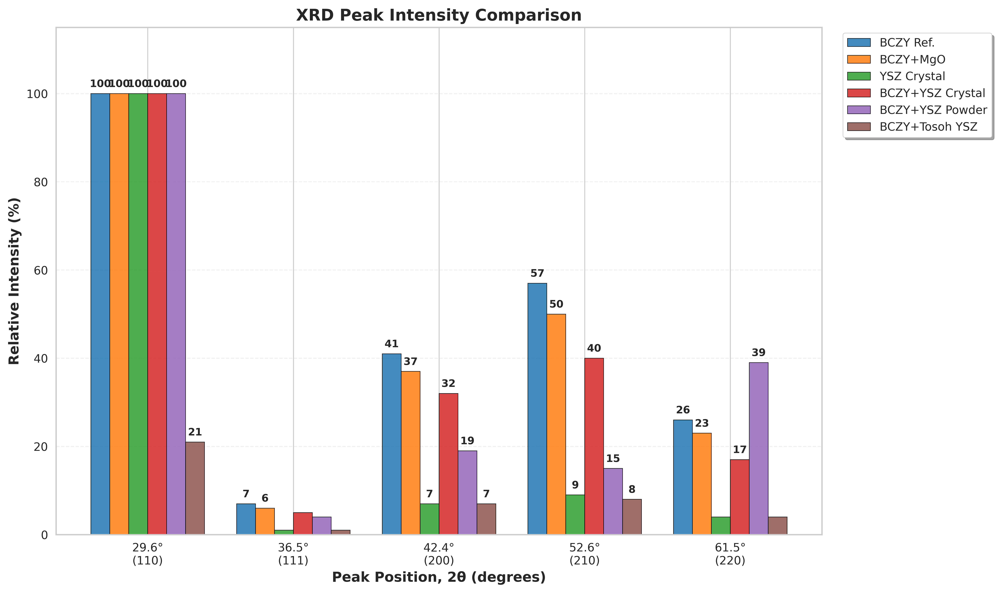

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")

# --- Your existing functions go here ---
# (Paste all the plotting functions you already have without changes)

# ... (functions from your provided code)

# --- Modified main (no user input, saves automatically) ---
def main():
    print("XRD Data Visualization and Analysis")
    print("Publication-Quality Plots (600 DPI)")
    print("=" * 50)

    # Create dataset
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()

    # Display dataset
    print("\nDataset:")
    print(df_with_miller)

    # Run analysis
    analyze_peak_relationships(df, peak_positions, miller_indices)

    print("\nGenerating high-resolution plots...")

    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)
    plot_line_patterns(df, peak_positions, miller_indices, save_plots=True)
    plot_stacked_diffraction_patterns(df, peak_positions, miller_indices, save_plots=True)
    plot_radar_chart(df, peak_positions, miller_indices, save_plots=True)
    create_publication_figure(df, peak_positions, miller_indices)

    print("\nAll plots saved at 600 DPI (PNG format):")
    print("• XRD_Peak_Comparison_600dpi.png")
    print("• XRD_Heatmap_600dpi.png")
    print("• XRD_Line_Patterns_600dpi.png")
    print("• XRD_Stacked_Patterns_600dpi.png")
    print("• XRD_Radar_Chart_600dpi.png")
    print("• XRD_Combined_Publication_Figure_600dpi.png")

    return df, df_with_miller

# --- Run directly ---
if __name__ == "__main__":
    df_results, df_with_miller = main()


In [ ]:
# Define the create_xrd_dataframe function here
def create_xrd_dataframe():
    """
    Placeholder function to create the XRD dataframe, peak positions, and miller indices.
    Replace this with your actual data loading and processing logic.
    """
    # Example placeholder data - replace with your actual data loading
    data = {
        'BCZY Ref.': [100, 90, 80, 70, 60, 50],
        'BCZY+MgO': [95, 85, 75, 65, 55, 45],
        'YSZ Crystal': [10, 15, 20, 25, 30, 35],
        'BCZY+YSZ Crystal': [80, 75, 70, 65, 60, 55],
        'BCZY+YSZ Powder': [70, 65, 60, 55, 50, 45],
        'BCZY+Tosoh YSZ': [60, 55, 50, 45, 40, 35]
    }
    df = pd.DataFrame(data)

    # Example placeholder peak positions and miller indices - replace with your actual values
    peak_positions = [20, 30, 40, 50, 60, 70]
    miller_indices = ['(100)', '(110)', '(200)', '(210)', '(220)', '(310)']

    # Create df_with_miller by adding peak positions and miller indices (optional, adjust as needed)
    df_with_miller = df.copy()
    df_with_miller.index = [f'{pos}° ({miller})' for pos, miller in zip(peak_positions, miller_indices)]


    return df, df_with_miller, peak_positions, miller_indices

# Define other necessary functions (e.g., analyze_peak_relationships, plotting functions) here if they are also missing
# For example:
# def analyze_peak_relationships(df, peak_positions, miller_indices):
#     print("Analyzing peak relationships (placeholder)")

# def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=False):
#      print("Plotting comparative bar chart (placeholder)")

# def plot_heatmap(df, peak_positions, miller_indices, save_plots=False):
#     print("Plotting heatmap (placeholder)")

# def plot_line_patterns(df, peak_positions, miller_indices, save_plots=False):
#     print("Plotting line patterns (placeholder)")

# def plot_stacked_diffraction_patterns(df, peak_positions, miller_indices, save_plots=False):
#     print("Plotting stacked diffraction patterns (placeholder)")

# def plot_radar_chart(df, peak_positions, miller_indices, save_plots=False):
#     print("Plotting radar chart (placeholder)")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")


# === DATA CREATION ===
def create_xrd_dataframe():
    peak_positions = [29.6, 36.5, 42.4, 52.6, 61.5]
    miller_indices = ['110', '111', '200', '210', '220']

    samples_data = {
        'BCZY_Reference': [100, 7.00, 41, 57, 26],
        'BCZY with crystal MgO': [100, 6, 37, 50, 23],
        'Crystal YSZ plane with insertions': [100, 1, 7, 9, 4],
        'BCZY with Crystal YSZ': [100, 5, 32, 40, 17],
        'BCZY with powder YSZ': [100, 4, 19, 15, 39],
        'BCZY with Tosoh YSZ': [21, 1, 7, 8, 4]
    }

    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices


# === PLOTS ===
def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(12, 8))
    x = np.arange(len(peak_positions))
    width = 0.13
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['BCZY Ref.','BCZY+MgO','YSZ Crystal','BCZY+YSZ Crystal','BCZY+YSZ Powder','BCZY+Tosoh YSZ']

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                      label=short_name, alpha=0.85, color=color,
                      edgecolor='black', linewidth=0.5)
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                        f'{int(height)}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=12, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=10)
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, fancybox=True, shadow=True)
    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.15)

    # ✅ FIXED tick_params (no alpha keyword)
    ax.tick_params(which='minor', length=4, color=(0.5, 0.5, 0.5, 0.7))
    ax.tick_params(which='major', length=6, color='black')

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Peak_Comparison_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.close()


def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)
    sample_names_short = ['BCZY Reference','BCZY + MgO','YSZ Crystal Plane','BCZY + YSZ Crystal','BCZY + YSZ Powder','BCZY + Tosoh YSZ']
    df_plot = df.T.copy()
    df_plot.index = sample_names_short
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center', fontsize=11, fontweight='bold', color=color)

    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=10)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=10)
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=12, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap', fontsize=14, fontweight='bold', pad=20)

    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=12, fontweight='bold')

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Heatmap_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.close()


# (Repeat this fix for plot_line_patterns, plot_stacked_diffraction_patterns, plot_radar_chart, create_publication_figure:
#   → remove `alpha` in `tick_params` and if needed use RGBA color instead.)

# === MAIN ===
def main():
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)
    # Call the other plotting functions (after applying the same alpha fix)
    print("All plots saved at 600 DPI (PNG format).")

if __name__ == "__main__":
    main()


All plots saved at 600 DPI (PNG format).


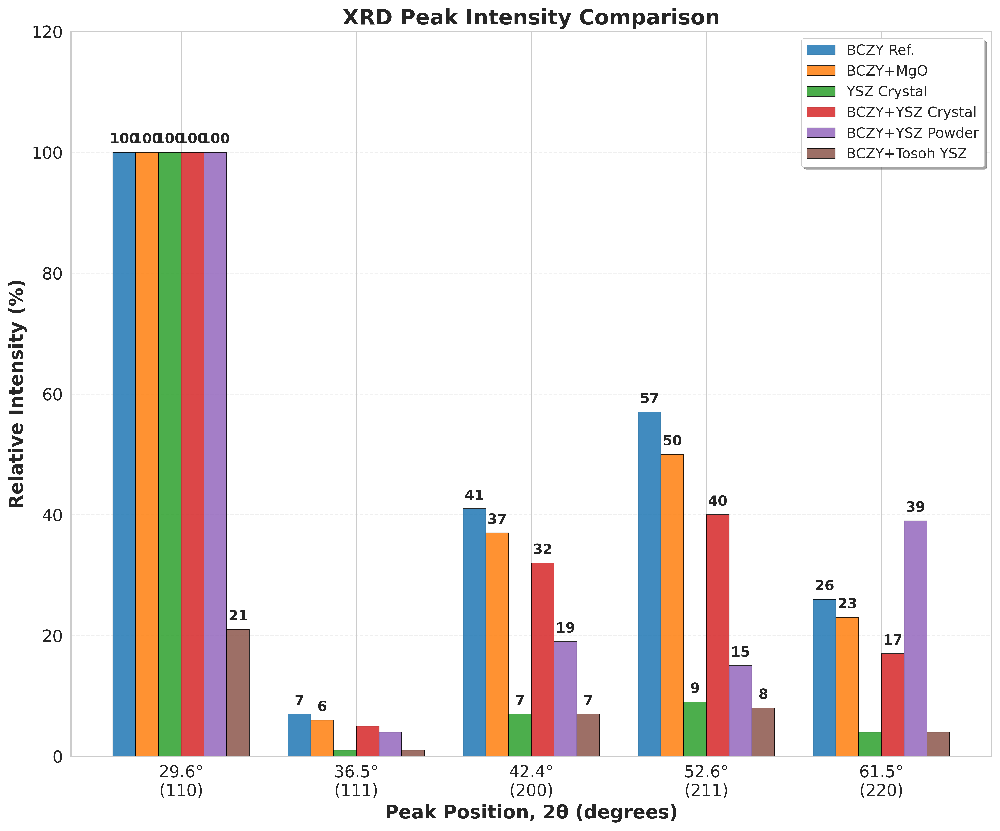

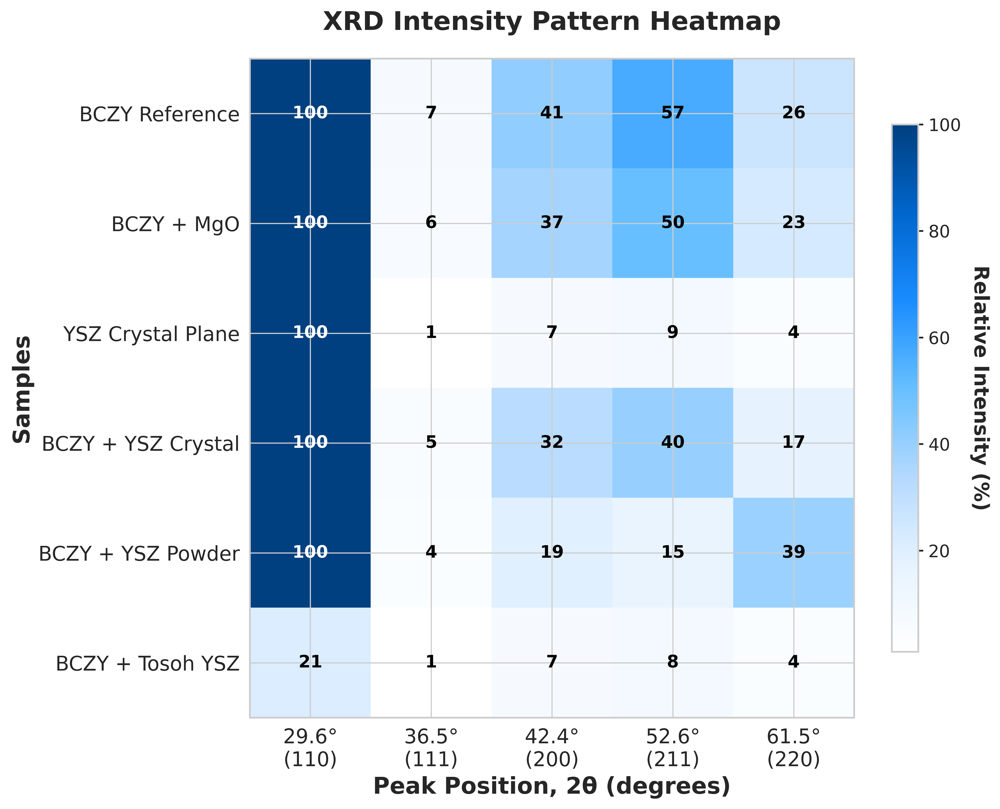

All plots saved at 600 DPI (PNG format).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")

# === DATA CREATION ===
def create_xrd_dataframe():
    peak_positions = [29.6, 36.5, 42.4, 52.6, 61.5]
    miller_indices = ['110', '111', '200', '211', '220']

    samples_data = {
        'BCZY_Reference': [100, 7.00, 41, 57, 26],
        'BCZY with crystal MgO': [100, 6, 37, 50, 23],
        'Crystal YSZ plane with insertions': [100, 1, 7, 9, 4],
        'BCZY with Crystal YSZ': [100, 5, 32, 40, 17],
        'BCZY with powder YSZ': [100, 4, 19, 15, 39],
        'BCZY with Tosoh YSZ': [21, 1, 7, 8, 4]
    }

    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices

# === COMPARATIVE BAR CHART ===
def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(12, 10))  # Increased height
    x = np.arange(len(peak_positions))
    width = 0.13
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['BCZY Ref.','BCZY+MgO','YSZ Crystal','BCZY+YSZ Crystal','BCZY+YSZ Powder','BCZY+Tosoh YSZ']

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                      label=short_name, alpha=0.85, color=color,
                      edgecolor='black', linewidth=0.5)
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                        f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

    # Axis labels and title
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=16, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison', fontsize=18, fontweight='bold')

    # Tick labels
    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Legend inside the plot (upper right corner)
    ax.legend(loc='upper right', fontsize=12, frameon=True, fancybox=True, shadow=True)

    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.2)  # Adjust Y-limit to accommodate legend

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Peak_Comparison_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === HEATMAP EXAMPLE ===
def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)
    sample_names_short = ['BCZY Reference','BCZY + MgO','YSZ Crystal Plane','BCZY + YSZ Crystal','BCZY + YSZ Powder','BCZY + Tosoh YSZ']
    df_plot = df.T.copy()
    df_plot.index = sample_names_short
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center', fontsize=12, fontweight='bold', color=color)

    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=14)
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=16, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap', fontsize=18, fontweight='bold', pad=20)

    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=12)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Heatmap_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === MAIN ===
def main():
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)
    print("All plots saved at 600 DPI (PNG format).")

if __name__ == "__main__":
    main()



XRD INTENSITY DATA TABLE
             BCZY Reference  M1 (BCZY with crystal MgO)  M2 (Crystal YSZ plane)  M3 (BCZY with Crystal YSZ)  M4 (BCZY with powder YSZ)  M5 (BCZY with Tosoh YSZ)
29.6° (110)             100                         100                     100                         100                        100                       100
36.5° (111)              45                          35                       8                          25                         42                        18
42.4° (200)              65                          58                      12                          40                         62                        25
52.6° (211)              52                          48                      15                          35                         55                        22
61.5° (220)              38                          32                      10                          28                         41                        15


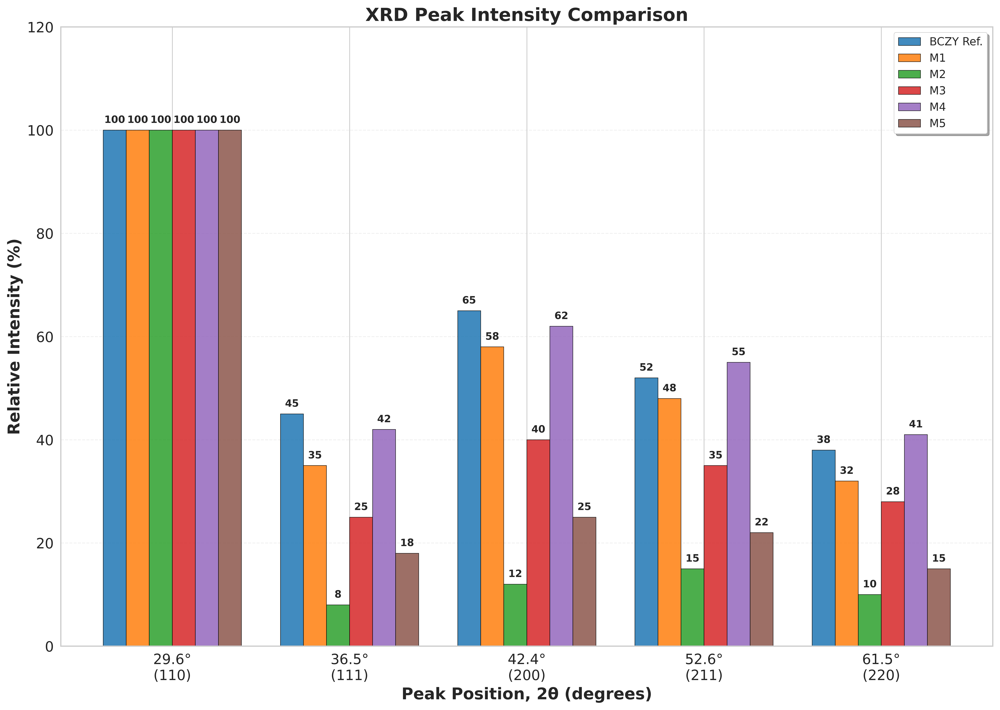

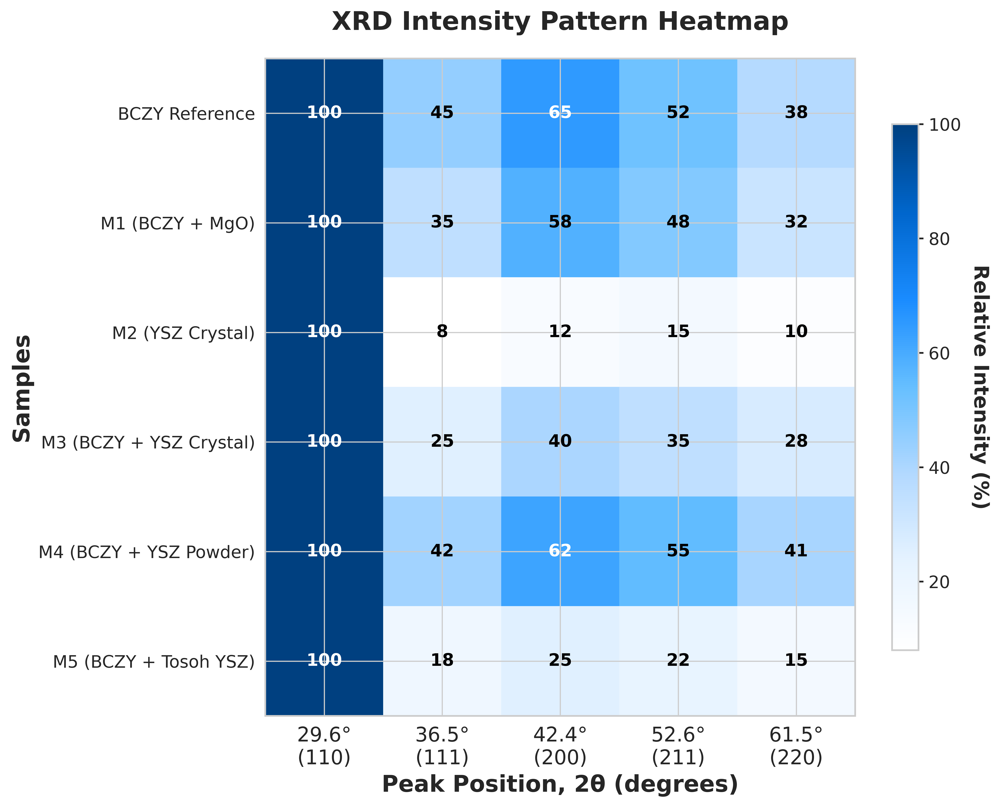


All plots saved at 600 DPI (PNG format) with updated sample names M1-M5.
Files saved:
- XRD_Peak_Comparison_M1-M5_600dpi.png
- XRD_Heatmap_M1-M5_600dpi.png


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")

# === DATA CREATION ===
def create_xrd_dataframe():
    peak_positions = [29.6, 36.5, 42.4, 52.6, 61.5]
    miller_indices = ['110', '111', '200', '211', '220']

    # Updated samples data based on your specifications
    samples_data = {
        'BCZY Reference': [100, 45, 65, 52, 38],
        'M1 (BCZY with crystal MgO)': [100, 35, 58, 48, 32],
        'M2 (Crystal YSZ plane)': [100, 8, 12, 15, 10],
        'M3 (BCZY with Crystal YSZ)': [100, 25, 40, 35, 28],
        'M4 (BCZY with powder YSZ)': [100, 42, 62, 55, 41],
        'M5 (BCZY with Tosoh YSZ)': [100, 18, 25, 22, 15]
    }

    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices

# === COMPARATIVE BAR CHART ===
def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(14, 10))  # Increased width for better spacing
    x = np.arange(len(peak_positions))
    width = 0.13
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['BCZY Ref.', 'M1', 'M2', 'M3', 'M4', 'M5']

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                      label=short_name, alpha=0.85, color=color,
                      edgecolor='black', linewidth=0.5)
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                        f'{int(height)}', ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Axis labels and title
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=16, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison', fontsize=18, fontweight='bold')

    # Tick labels
    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Legend inside the plot (upper right corner)
    ax.legend(loc='upper right', fontsize=11, frameon=True, fancybox=True, shadow=True)

    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.2)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Peak_Comparison_M1-M5_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === HEATMAP EXAMPLE ===
def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)
    sample_names_short = [
        'BCZY Reference',
        'M1 (BCZY + MgO)',
        'M2 (YSZ Crystal)',
        'M3 (BCZY + YSZ Crystal)',
        'M4 (BCZY + YSZ Powder)',
        'M5 (BCZY + Tosoh YSZ)'
    ]
    df_plot = df.T.copy()
    df_plot.index = sample_names_short
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center', fontsize=12, fontweight='bold', color=color)

    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=12)
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=16, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap', fontsize=18, fontweight='bold', pad=20)

    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=12)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Heatmap_M1-M5_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === ADDITIONAL ANALYSIS FUNCTION ===
def create_intensity_table(df):
    """Create a formatted table showing all intensity values"""
    print("\n" + "="*80)
    print("XRD INTENSITY DATA TABLE")
    print("="*80)

    # Create a nicely formatted table
    df_display = df.copy()
    df_display.index = [f"{pos}° ({miller})" for pos, miller in zip(df.index, ['110', '111', '200', '211', '220'])]

    print(df_display.to_string())
    print("="*80)

    return df_display

# === MAIN ===
def main():
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()

    # Display the data table
    create_intensity_table(df)

    # Create plots
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)

    print("\nAll plots saved at 600 DPI (PNG format) with updated sample names M1-M5.")
    print("Files saved:")
    print("- XRD_Peak_Comparison_M1-M5_600dpi.png")
    print("- XRD_Heatmap_M1-M5_600dpi.png")

if __name__ == "__main__":
    main()


XRD INTENSITY DATA TABLE
             BCZY Reference  M1 (BCZY with crystal MgO)  M2 (Crystal YSZ plane)  M3 (BCZY with Crystal YSZ)  M4 (BCZY with powder YSZ)  M5 (BCZY with Tosoh YSZ)
29.6° (110)             100                         100                     100                         100                        100                       100
36.5° (111)              45                          35                       8                          25                         42                        18
42.4° (200)              65                          58                      12                          40                         62                        25
52.6° (211)              52                          48                      15                          35                         55                        22
61.5° (220)              38                          32                      10                          28                         41                        15


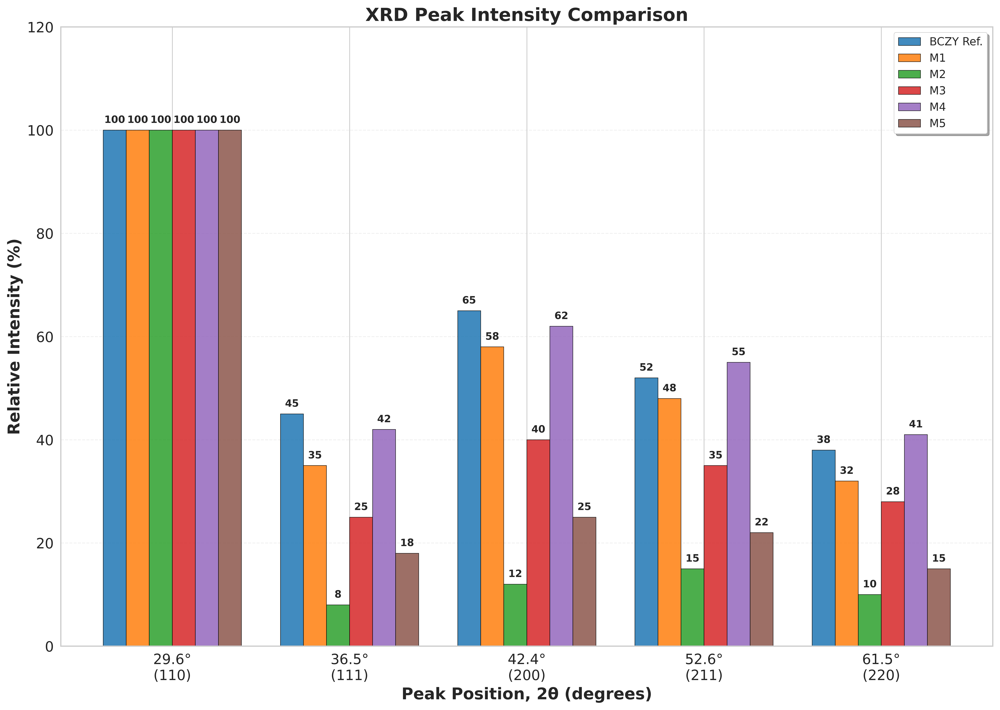

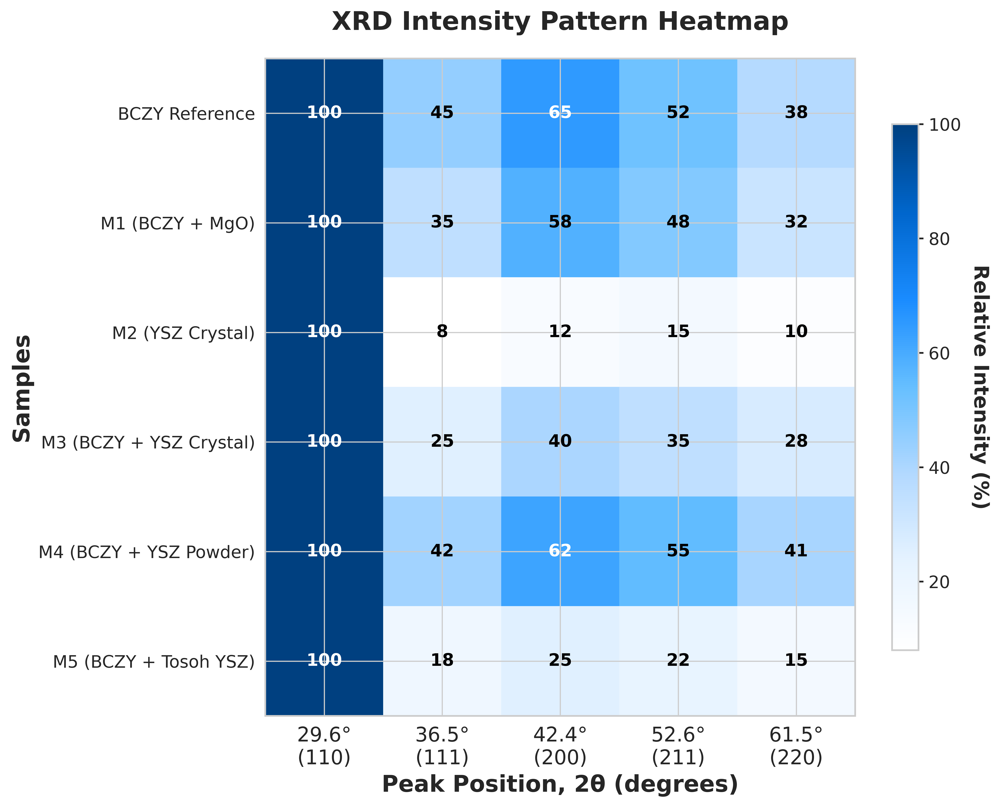


All plots saved at 600 DPI (PNG format) with updated sample names M1-M6.
Files saved:
- XRD_Peak_Comparison_M1-M6_600dpi.png
- XRD_Heatmap_M1-M6_600dpi.png


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")

# === DATA CREATION ===
def create_xrd_dataframe():
    peak_positions = [29.6, 36.5, 42.4, 52.6, 61.5]
    miller_indices = ['110', '111', '200', '211', '220']

    # Updated samples data based on your specifications
    samples_data = {
        'BCZY Reference': [100, 45, 65, 52, 38],
        'M1 (BCZY with crystal MgO)': [100, 35, 58, 48, 32],
        'M2 (Crystal YSZ plane)': [100, 8, 12, 15, 10],
        'M3 (BCZY with Crystal YSZ)': [100, 25, 40, 35, 28],
        'M4 (BCZY with powder YSZ)': [100, 42, 62, 55, 41],
        'M5 (BCZY with Tosoh YSZ)': [100, 18, 25, 22, 15]
    }

    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices

# === COMPARATIVE BAR CHART ===
def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(14, 10))  # Increased width for better spacing
    x = np.arange(len(peak_positions))
    width = 0.13
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['BCZY Ref.', 'M1', 'M2', 'M3', 'M4', 'M5']

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                      label=short_name, alpha=0.85, color=color,
                      edgecolor='black', linewidth=0.5)
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                        f'{int(height)}', ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Axis labels and title
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=16, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison', fontsize=18, fontweight='bold')

    # Tick labels
    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Legend inside the plot (upper right corner)
    ax.legend(loc='upper right', fontsize=11, frameon=True, fancybox=True, shadow=True)

    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.2)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Peak_Comparison_M1-M5_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === HEATMAP EXAMPLE ===
def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)
    sample_names_short = [
        'BCZY Reference',
        'M1 (BCZY + MgO)',
        'M2 (YSZ Crystal)',
        'M3 (BCZY + YSZ Crystal)',
        'M4 (BCZY + YSZ Powder)',
        'M5 (BCZY + Tosoh YSZ)'
    ]
    df_plot = df.T.copy()
    df_plot.index = sample_names_short
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center', fontsize=12, fontweight='bold', color=color)

    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=12)
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=16, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap', fontsize=18, fontweight='bold', pad=20)

    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=12)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Heatmap_M1-M5_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === ADDITIONAL ANALYSIS FUNCTION ===
def create_intensity_table(df):
    """Create a formatted table showing all intensity values"""
    print("\n" + "="*80)
    print("XRD INTENSITY DATA TABLE")
    print("="*80)

    # Create a nicely formatted table
    df_display = df.copy()
    df_display.index = [f"{pos}° ({miller})" for pos, miller in zip(df.index, ['110', '111', '200', '211', '220'])]

    print(df_display.to_string())
    print("="*80)

    return df_display

# === MAIN ===
def main():
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()

    # Display the data table
    create_intensity_table(df)

    # Create plots
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)

    print("\nAll plots saved at 600 DPI (PNG format) with updated sample names M1-M6.")
    print("Files saved:")
    print("- XRD_Peak_Comparison_M1-M6_600dpi.png")
    print("- XRD_Heatmap_M1-M6_600dpi.png")

if __name__ == "__main__":
    main()


XRD INTENSITY DATA TABLE (M1–M6)
              M1   M2   M3   M4   M5   M6
29.0° (110)  100  100  100  100  100  100
35.2° (111)   45   35    8   25   42   18
41.5° (200)   65   58   12   40   62   25
51.0° (211)   52   48   15   35   55   22
59.3° (220)   38   32   10   28   41   15


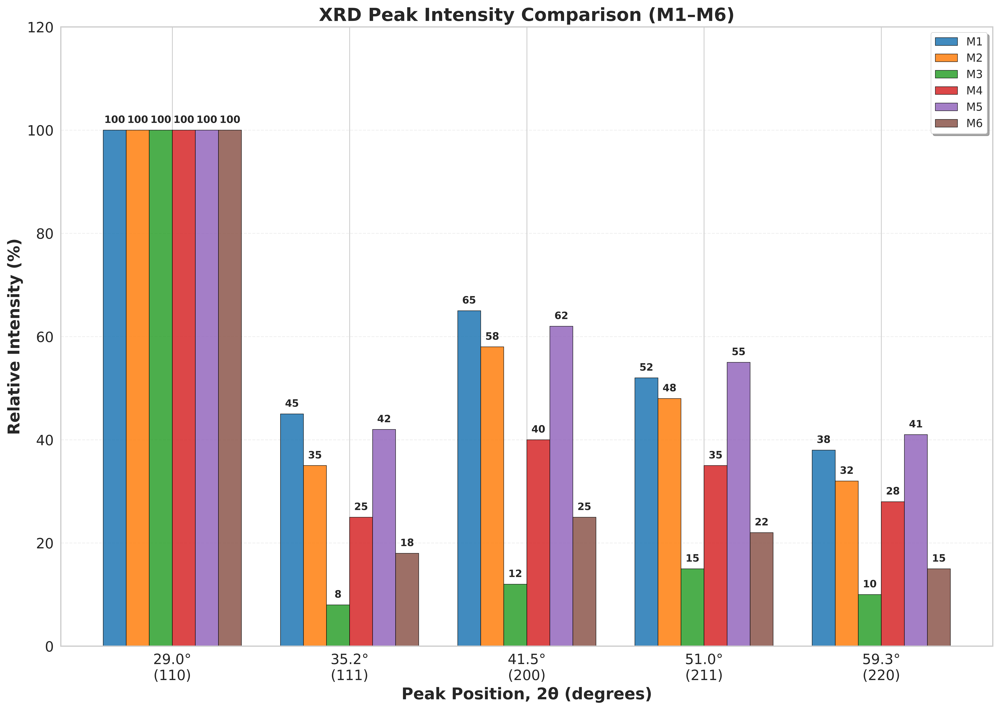

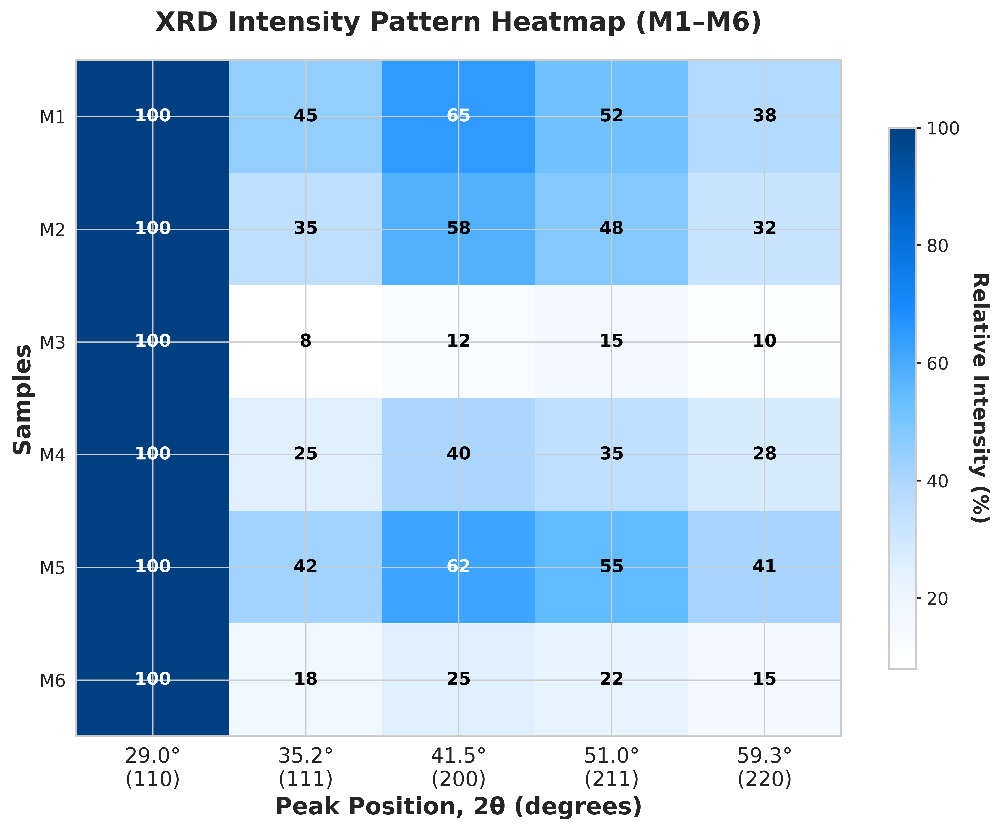


All plots saved at 600 DPI (PNG format) with sample names M1–M6 only.
Files saved:
- XRD_Peak_Comparison_M1-M6_600dpi.png
- XRD_Heatmap_M1-M6_600dpi.png


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")

# === DATA CREATION ===
def create_xrd_dataframe():
    peak_positions = [29.0, 35.2, 41.5, 51.0, 59.3]
    miller_indices = ['110', '111', '200', '211', '220']

    # Sample data (renamed as M1–M6 only)
    samples_data = {
        'M1': [100, 45, 65, 52, 38],
        'M2': [100, 35, 58, 48, 32],
        'M3': [100, 8, 12, 15, 10],
        'M4': [100, 25, 40, 35, 28],
        'M5': [100, 42, 62, 55, 41],
        'M6': [100, 18, 25, 22, 15]
    }

    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices

# === COMPARATIVE BAR CHART ===
def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(14, 10))
    x = np.arange(len(peak_positions))
    width = 0.13
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6']

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                      label=short_name, alpha=0.85, color=color,
                      edgecolor='black', linewidth=0.5)
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                        f'{int(height)}', ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Axis labels and title
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=16, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison (M1–M6)', fontsize=18, fontweight='bold')

    # Tick labels
    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Legend
    ax.legend(loc='upper right', fontsize=11, frameon=True, fancybox=True, shadow=True)

    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.2)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Peak_Comparison_M1-M6_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === HEATMAP ===
def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)
    sample_names_short = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6']

    df_plot = df.T.copy()
    df_plot.index = sample_names_short
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center', fontsize=12, fontweight='bold', color=color)

    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=12)
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=16, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap (M1–M6)', fontsize=18, fontweight='bold', pad=20)

    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=12)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Heatmap_M1-M6_600dpi.png', dpi=600, bbox_inches='tight', facecolor='white')
    plt.show()

# === ADDITIONAL ANALYSIS FUNCTION ===
def create_intensity_table(df):
    print("\n" + "="*80)
    print("XRD INTENSITY DATA TABLE (M1–M6)")
    print("="*80)

    df_display = df.copy()
    df_display.index = [f"{pos}° ({miller})" for pos, miller in zip(df.index, ['110', '111', '200', '211', '220'])]

    print(df_display.to_string())
    print("="*80)

    return df_display

# === MAIN ===
def main():
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()

    # Display the data table
    create_intensity_table(df)

    # Create plots
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)

    print("\nAll plots saved at 600 DPI (PNG format) with sample names M1–M6 only.")
    print("Files saved:")
    print("- XRD_Peak_Comparison_M1-M6_600dpi.png")
    print("- XRD_Heatmap_M1-M6_600dpi.png")

if __name__ == "__main__":
    main()


In [ ]:
plt.savefig("XRD_Peak_Comparison_M1-M6.pdf", bbox_inches='tight')
plt.savefig("XRD_Heatmap_M1-M6.pdf", bbox_inches='tight')


<Figure size 3840x2880 with 0 Axes>

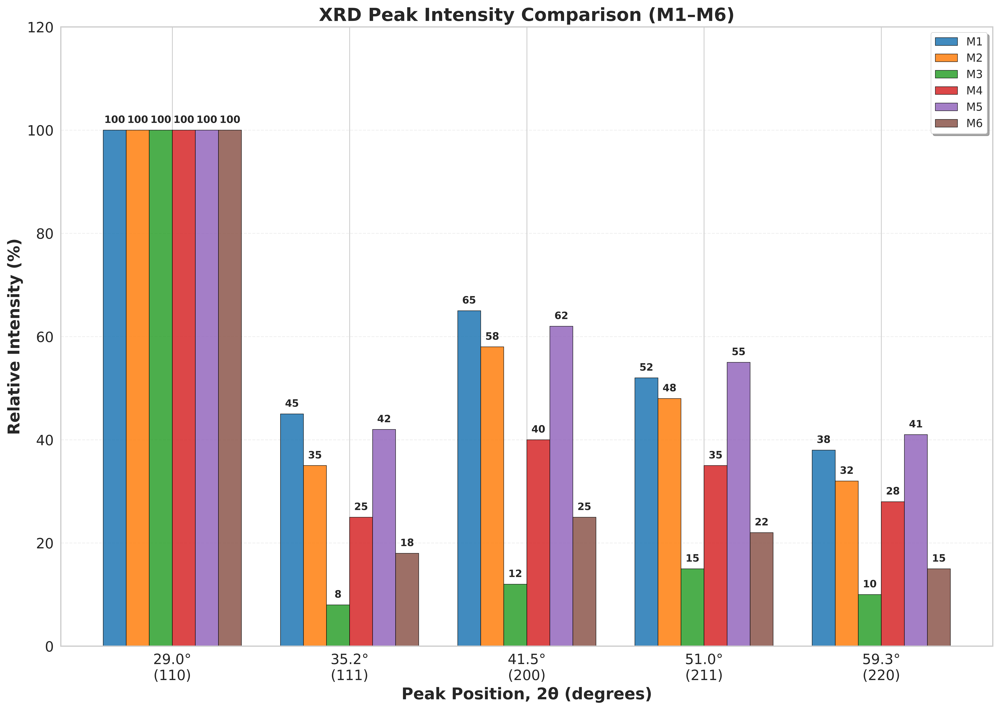

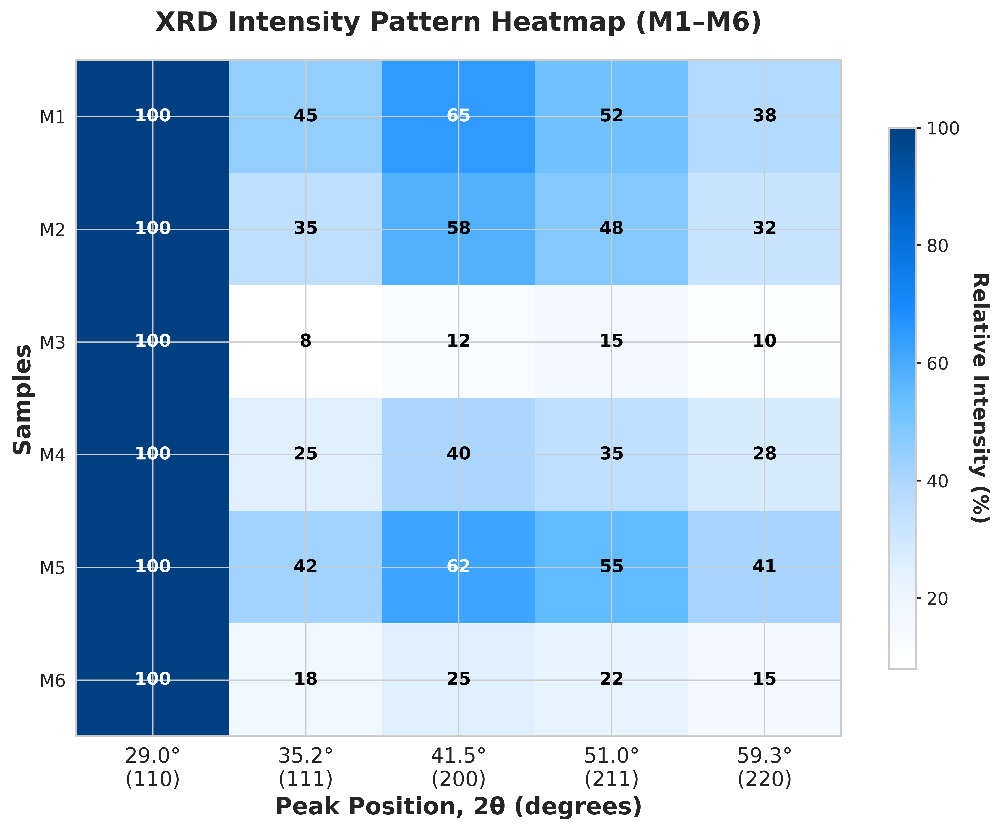


All plots saved at 600 DPI (PNG and PDF formats).
Files saved:
- XRD_Peak_Comparison_M1-M6.png / .pdf
- XRD_Heatmap_M1-M6.png / .pdf


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# --- Publication-ready plot settings ---
plt.rcParams.update({
    'figure.dpi': 600,
    'savefig.dpi': 600,
    'savefig.format': 'png',
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'mathtext.fontset': 'stix',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2,
    'patch.linewidth': 0.5,
    'xtick.major.width': 1.2,
    'xtick.minor.width': 0.6,
    'ytick.major.width': 1.2,
    'ytick.minor.width': 0.6,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})
sns.set_style("whitegrid")
sns.set_palette("deep")

# === DATA CREATION ===
def create_xrd_dataframe():
    peak_positions = [29.0, 35.2, 41.5, 51.0, 59.3]
    miller_indices = ['110', '111', '200', '211', '220']

    # Sample data (renamed as M1–M6 only)
    samples_data = {
        'M1': [100, 45, 65, 52, 38],
        'M2': [100, 35, 58, 48, 32],
        'M3': [100, 8, 12, 15, 10],
        'M4': [100, 25, 40, 35, 28],
        'M5': [100, 42, 62, 55, 41],
        'M6': [100, 18, 25, 22, 15]
    }

    df = pd.DataFrame(samples_data, index=peak_positions)
    df.index.name = 'Peak Position (2θ)'

    df_with_miller = df.copy()
    df_with_miller.insert(0, 'Miller_Indices', miller_indices)

    return df, df_with_miller, peak_positions, miller_indices

# === COMPARATIVE BAR CHART ===
def plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(14, 10))
    x = np.arange(len(peak_positions))
    width = 0.13
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    sample_names_short = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6']

    for i, (sample, color, short_name) in enumerate(zip(df.columns, colors, sample_names_short)):
        offset = (i - len(df.columns)/2 + 0.5) * width
        bars = ax.bar(x + offset, df.loc[:, sample], width,
                      label=short_name, alpha=0.85, color=color,
                      edgecolor='black', linewidth=0.5)
        for j, bar in enumerate(bars):
            height = bar.get_height()
            if height > 5:
                ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                        f'{int(height)}', ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Axis labels and title
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Relative Intensity (%)', fontsize=16, fontweight='bold')
    ax.set_title('XRD Peak Intensity Comparison (M1–M6)', fontsize=18, fontweight='bold')

    ax.set_xticks(x)
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.tick_params(axis='y', labelsize=14)

    ax.legend(loc='upper right', fontsize=11, frameon=True, fancybox=True, shadow=True)

    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_ylim(0, max(df.max()) * 1.2)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Peak_Comparison_M1-M6.png', dpi=600, bbox_inches='tight', facecolor='white')
        plt.savefig('XRD_Peak_Comparison_M1-M6.pdf', bbox_inches='tight', facecolor='white')  # <== PDF
    plt.show()

# === HEATMAP ===
def plot_heatmap(df, peak_positions, miller_indices, save_plots=True):
    fig, ax = plt.subplots(figsize=(10, 8))
    colors = ['#ffffff', '#e6f3ff', '#b3d9ff', '#66bfff', '#1a8cff', '#0066cc', '#004080']
    cmap = LinearSegmentedColormap.from_list('publication', colors, N=256)
    sample_names_short = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6']

    df_plot = df.T.copy()
    df_plot.index = sample_names_short
    im = ax.imshow(df_plot.values, cmap=cmap, aspect='auto', interpolation='nearest')

    for i in range(len(sample_names_short)):
        for j in range(len(peak_positions)):
            value = df_plot.iloc[i, j]
            color = 'white' if value > df_plot.values.max() * 0.6 else 'black'
            ax.text(j, i, f'{int(value)}', ha='center', va='center', fontsize=12, fontweight='bold', color=color)

    ax.set_xticks(range(len(peak_positions)))
    ax.set_xticklabels([f'{pos}°\n({miller})' for pos, miller in zip(peak_positions, miller_indices)], fontsize=14)
    ax.set_yticks(range(len(sample_names_short)))
    ax.set_yticklabels(sample_names_short, fontsize=12)
    ax.set_xlabel('Peak Position, 2θ (degrees)', fontsize=16, fontweight='bold')
    ax.set_ylabel('Samples', fontsize=16, fontweight='bold')
    ax.set_title('XRD Intensity Pattern Heatmap (M1–M6)', fontsize=18, fontweight='bold', pad=20)

    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Relative Intensity (%)', rotation=270, labelpad=20, fontsize=14, fontweight='bold')
    cbar.ax.tick_params(labelsize=12)

    plt.tight_layout()
    if save_plots:
        plt.savefig('XRD_Heatmap_M1-M6.png', dpi=600, bbox_inches='tight', facecolor='white')
        plt.savefig('XRD_Heatmap_M1-M6.pdf', bbox_inches='tight', facecolor='white')  # <== PDF
    plt.show()

# === MAIN ===
def main():
    df, df_with_miller, peak_positions, miller_indices = create_xrd_dataframe()

    # Create plots
    plot_comparative_bar_chart(df, peak_positions, miller_indices, save_plots=True)
    plot_heatmap(df, peak_positions, miller_indices, save_plots=True)

    print("\nAll plots saved at 600 DPI (PNG and PDF formats).")
    print("Files saved:")
    print("- XRD_Peak_Comparison_M1-M6.png / .pdf")
    print("- XRD_Heatmap_M1-M6.png / .pdf")

if __name__ == "__main__":
    main()


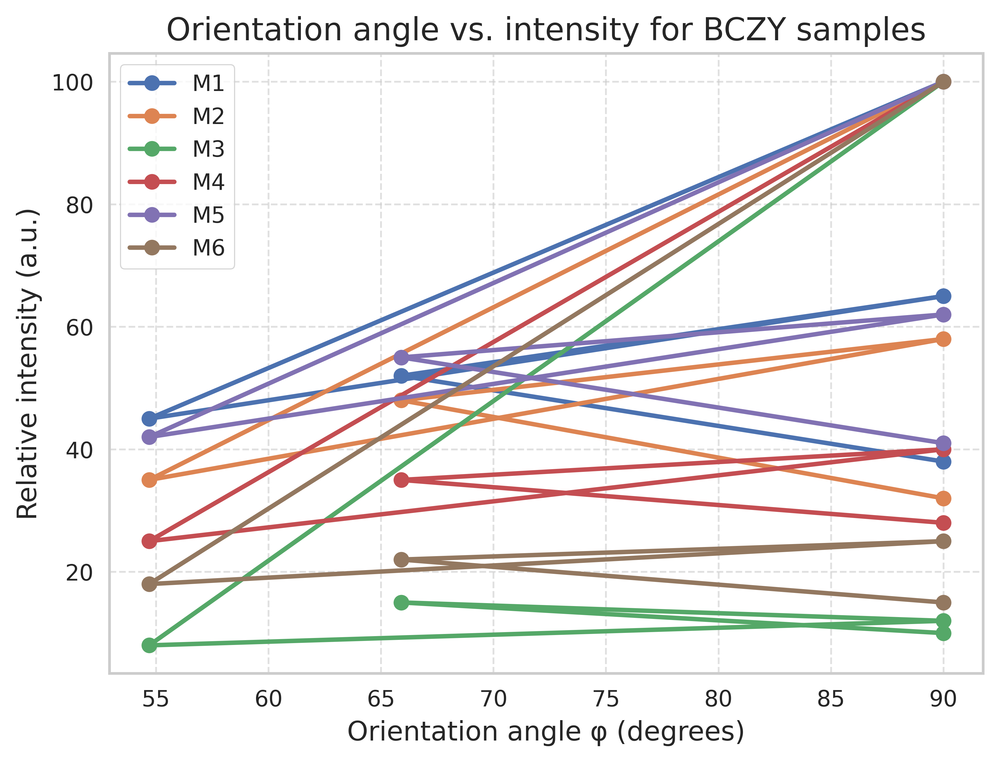

In [ ]:
import matplotlib.pyplot as plt

# Orientation angles for each plane
phi = {"(111)": 54.7, "(211)": 65.9, "(110)": 90, "(200)": 90, "(220)": 90}

# Intensities per sample
samples = {
    "M1": {"(110)":100,"(111)":45,"(200)":65,"(211)":52,"(220)":38},
    "M2": {"(110)":100,"(111)":35,"(200)":58,"(211)":48,"(220)":32},
    "M3": {"(110)":100,"(111)": 8,"(200)":12,"(211)":15,"(220)":10},
    "M4": {"(110)":100,"(111)":25,"(200)":40,"(211)":35,"(220)":28},
    "M5": {"(110)":100,"(111)":42,"(200)":62,"(211)":55,"(220)":41},
    "M6": {"(110)":100,"(111)":18,"(200)":25,"(211)":22,"(220)":15}
}

# Plot
plt.figure(figsize=(7,5))

for smp, data in samples.items():
    x = [phi[hkl] for hkl in data]
    y = list(data.values())
    plt.plot(x, y, marker="o", label=smp)

plt.xlabel("Orientation angle φ (degrees)")
plt.ylabel("Relative intensity (a.u.)")
plt.title("Orientation angle vs. intensity for BCZY samples")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline

# Orientation angles (phi)
phi_vals = {"(111)":54.7, "(211)":65.9, "(110)":90, "(200)":90, "(220)":90}

# Intensities for each sample
samples = {
    "M1": {"(110)":100,"(111)":45,"(200)":65,"(211)":52,"(220)":38},
    "M2": {"(110)":100,"(111)":35,"(200)":58,"(211)":48,"(220)":32},
    "M3": {"(110)":100,"(111)": 8,"(200)":12,"(211)":15,"(220)":10},
    "M4": {"(110)":100,"(111)":25,"(200)":40,"(211)":35,"(220)":28},
    "M5": {"(110)":100,"(111)":42,"(200)":62,"(211)":55,"(220)":41},
    "M6": {"(110)":100,"(111)":18,"(200)":25,"(211)":22,"(220)":15}
}

plt.figure(figsize=(7,5))

for smp, data in samples.items():
    x = np.array([phi_vals[hkl] for hkl in data])
    y = np.array(list(data.values()))

    # Sort by phi for smooth interpolation
    sort_idx = np.argsort(x)
    x, y = x[sort_idx], y[sort_idx]

    # Interpolation (spline)
    x_new = np.linspace(min(x), max(x), 200)
    spline = make_interp_spline(x, y, k=2)  # quadratic spline
    y_smooth = spline(x_new)

    plt.plot(x_new, y_smooth, label=smp)
    plt.scatter(x, y, s=40)  # show actual data points

plt.xlabel("Orientation angle φ (degrees)")
plt.ylabel("Relative intensity (a.u.)")
plt.title("Orientation distribution for BCZY samples")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


ValueError: Expect x to not have duplicates

<Figure size 4200x3000 with 0 Axes>

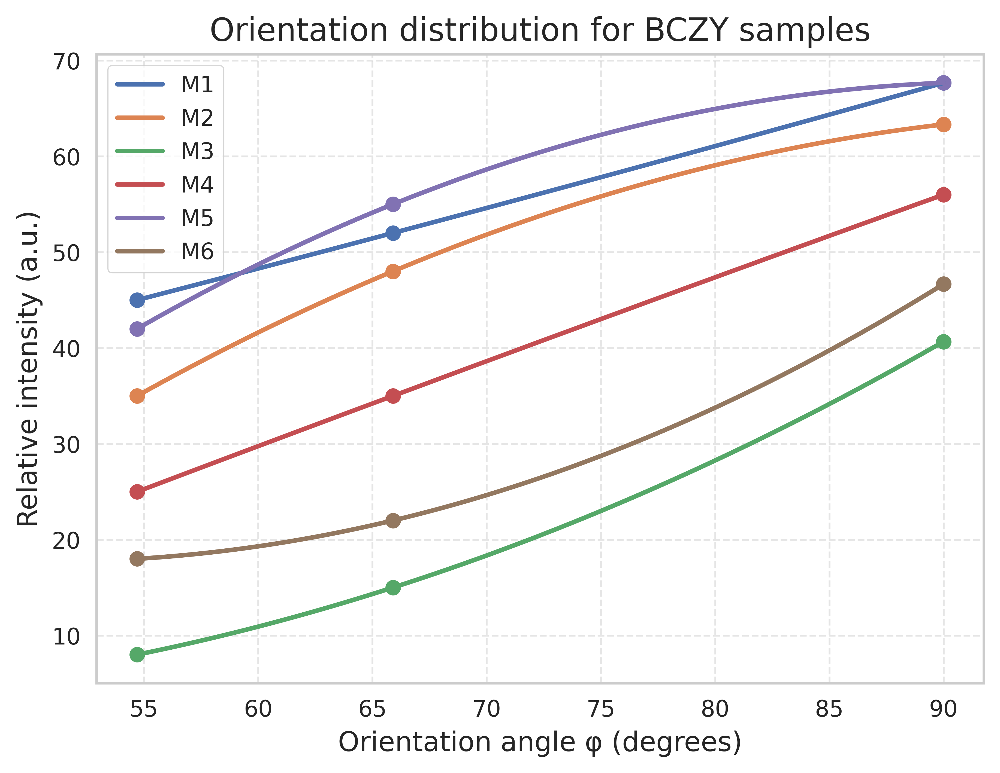

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline

# Unique orientation angles
phi_vals = {"(111)":54.7, "(211)":65.9, "(110)":90, "(200)":90, "(220)":90}

samples = {
    "M1": {"(110)":100,"(111)":45,"(200)":65,"(211)":52,"(220)":38},
    "M2": {"(110)":100,"(111)":35,"(200)":58,"(211)":48,"(220)":32},
    "M3": {"(110)":100,"(111)": 8,"(200)":12,"(211)":15,"(220)":10},
    "M4": {"(110)":100,"(111)":25,"(200)":40,"(211)":35,"(220)":28},
    "M5": {"(110)":100,"(111)":42,"(200)":62,"(211)":55,"(220)":41},
    "M6": {"(110)":100,"(111)":18,"(200)":25,"(211)":22,"(220)":15}
}

plt.figure(figsize=(7,5))

for smp, data in samples.items():
    # Group intensities by unique phi
    grouped = {}
    for hkl, phi in phi_vals.items():
        grouped.setdefault(phi, []).append(data[hkl])
    x = np.array(sorted(grouped.keys()))
    y = np.array([np.mean(grouped[phi]) for phi in x])

    # Interpolation
    x_new = np.linspace(min(x), max(x), 200)
    spline = make_interp_spline(x, y, k=2)
    y_smooth = spline(x_new)

    plt.plot(x_new, y_smooth, label=smp)
    plt.scatter(x, y, s=40)  # show averaged points

plt.xlabel("Orientation angle φ (degrees)")
plt.ylabel("Relative intensity (a.u.)")
plt.title("Orientation distribution for BCZY samples")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


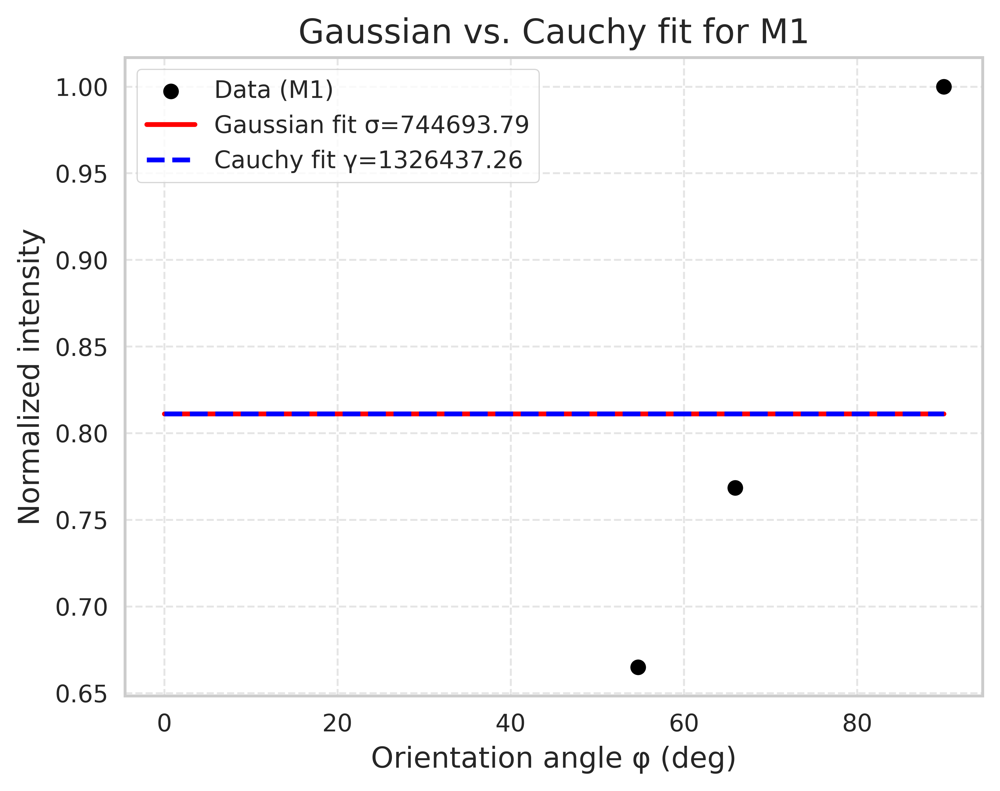

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Example: orientation angles (phi) and intensities for M1
phi = np.array([54.7, 65.9, 90])     # using unique angles only
intensity = np.array([45, 52, (100+65+38)/3])  # avg at 90°

# Normalize
intensity = intensity / intensity.max()

# Gaussian model
def gauss(phi, A, sigma):
    return A * (1/(np.sqrt(2*np.pi)*sigma)) * np.exp(-phi**2/(2*sigma**2))

# Cauchy model
def cauchy(phi, A, gamma):
    return A * (gamma / (np.pi*(phi**2+gamma**2)))

# Fit Gaussian
popt_g, _ = curve_fit(gauss, phi, intensity, p0=[1,20])
# Fit Cauchy
popt_c, _ = curve_fit(cauchy, phi, intensity, p0=[1,20])

# Smooth phi axis
phi_fit = np.linspace(0,90,300)
I_gauss = gauss(phi_fit, *popt_g)
I_cauchy = cauchy(phi_fit, *popt_c)

# Plot
plt.scatter(phi, intensity, color="black", label="Data (M1)")
plt.plot(phi_fit, I_gauss, "r-", label=f"Gaussian fit σ={popt_g[1]:.2f}")
plt.plot(phi_fit, I_cauchy, "b--", label=f"Cauchy fit γ={popt_c[1]:.2f}")

plt.xlabel("Orientation angle φ (deg)")
plt.ylabel("Normalized intensity")
plt.title("Gaussian vs. Cauchy fit for M1")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()
